In [1]:
import pandas as pd
import numpy as np
import os
import sys
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt
import random
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# To play audio files
import IPython.display as ipd
from IPython.display import Audio

# PyTorch libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, TensorDataset

from pathlib import Path
import random
import glob

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import soundfile
from pydub import AudioSegment
from pydub.silence import detect_nonsilent

CREMA-D is a data set of 7,442 original clips from 91 actors. These clips were from 48 male and 43 female actors between the ages of 20 and 74 coming from a variety of races and ethnicities (African America, Asian, Caucasian, Hispanic, and Unspecified). Actors spoke from a selection of 12 sentences. The sentences were presented using one of six different emotions (Anger, Disgust, Fear, Happy, Neutral, and Sad) and four different emotion levels (Low, Medium, High, and Unspecified).

https://www.kaggle.com/datasets/ejlok1/cremad

In [2]:
#python3 'data/Crema-D/AudioWAV/'  'Crema' dataprocessing.py

In [3]:
Crema = "data/Crema-D/AudioWAV/"

'''
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ejlok1/cremad")

print("Path to dataset files:", path)
'''

'\nimport kagglehub\n\n# Download latest version\npath = kagglehub.dataset_download("ejlok1/cremad")\n\nprint("Path to dataset files:", path)\n'

In [4]:
crema_directory_list = os.listdir(Crema)

file_emotion = []
file_path = []

for file in crema_directory_list:
    # storing file paths
    file_path.append(Crema + file)
    # storing file emotions
    part=file.split('_')
    if part[2] == 'SAD':
        file_emotion.append('sad')
    elif part[2] == 'ANG':
        file_emotion.append('angry')
    elif part[2] == 'DIS':
        file_emotion.append('disgust')
    elif part[2] == 'FEA':
        file_emotion.append('fear')
    elif part[2] == 'HAP':
        file_emotion.append('happy')
    elif part[2] == 'NEU':
        file_emotion.append('neutral')
    else:
        file_emotion.append('Unknown')
        
# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Crema_df = pd.concat([emotion_df, path_df], axis=1)
print(Crema_df.Emotions.value_counts())

Emotions
disgust    1271
angry      1271
happy      1271
fear       1271
sad        1271
neutral    1087
Name: count, dtype: int64


In [5]:
Crema_df.head()

,Emotions,Path
0,disgust,data/Crema-D/AudioWAV/1011_TAI_DIS_XX.wav
1,angry,data/Crema-D/AudioWAV/1056_WSI_ANG_XX.wav
2,neutral,data/Crema-D/AudioWAV/1052_IEO_NEU_XX.wav
3,disgust,data/Crema-D/AudioWAV/1056_WSI_DIS_XX.wav
4,angry,data/Crema-D/AudioWAV/1035_IOM_ANG_XX.wav


In [6]:
LABEL_DICT = {0:'fear', 1:'neutral', 2:'happy',3:'angry', 4:'disgust', 5:'surprise',6:'sad'}
LABELS = list(LABEL_DICT.values())

reverse_label_dict = {v: k for k, v in LABEL_DICT.items()}
Crema_df['Emotions'] = Crema_df['Emotions'].map(reverse_label_dict)

In [7]:
Crema_df.head()

,Emotions,Path
0,4,data/Crema-D/AudioWAV/1011_TAI_DIS_XX.wav
1,3,data/Crema-D/AudioWAV/1056_WSI_ANG_XX.wav
2,1,data/Crema-D/AudioWAV/1052_IEO_NEU_XX.wav
3,4,data/Crema-D/AudioWAV/1056_WSI_DIS_XX.wav
4,3,data/Crema-D/AudioWAV/1035_IOM_ANG_XX.wav


In [8]:

# Get the longest audio duration
def get_max_audio_length():
    max_length = 0
    counter = 0
    fulltime =0
    lent = []
    for i in glob.glob(f'{Crema}/*.wav'):
        y, sr = librosa.load(i, sr=None)
        duration = librosa.get_duration(y=y, sr=sr)
        fulltime +=duration
        lent.append(duration)

        if duration > max_length:
            max_length = duration
    print(lent)
    return max_length

print(get_max_audio_length())


[2.8361875, 2.469125, 3.036375, 2.469125, 2.1688125, 2.3023125, 2.56925, 2.2755625, 1.8685625, 3.003, 2.7360625, 2.1354375, 3.470125, 3.003, 1.93525, 2.102125, 4.1374375, 2.3356875, 2.1688125, 2.3356875, 2.035375, 2.56925, 3.1364375, 2.3356875, 2.402375, 2.602625, 3.5035, 3.6703125, 1.968625, 2.43575, 2.56925, 2.3023125, 1.7350625, 2.3690625, 3.1698125, 2.6359375, 3.036375, 2.402375, 2.7026875, 2.3690625, 3.103125, 2.8028125, 2.402375, 2.535875, 2.6359375, 2.06875, 3.37, 3.2365625, 2.8695, 2.6693125, 2.2689375, 2.469125, 2.2689375, 3.7704375, 2.43575, 3.2699375, 2.535875, 2.5025, 2.7026875, 2.43575, 2.3023125, 3.1364375, 3.37, 2.102125, 2.8695625, 2.56925, 2.1354375, 2.902875, 2.102125, 2.6693125, 2.2689375, 3.37, 2.3356875, 2.6359375, 2.535875, 1.968625, 1.93525, 2.7026875, 2.6693125, 2.1688125, 2.6359375, 2.535875, 2.002, 1.93525, 1.8351875, 2.56925, 2.7360625, 2.1354375, 2.535875, 4.037375, 1.8018125, 2.2826875, 2.3356875, 2.8361875, 2.102125, 2.93625, 2.8695, 2.6359375, 1.93525, 2.

In [9]:
def get_log_melspec(data, sample_rate):
    """
    Function for extracting features from an audio sample.  The audio is preprocess to remove silence and then
    padded on both sides to ensure each clip is 5 seconds.
    Then the log mel spectrogram is extracted.
    """
    
    trimmed, _ = librosa.effects.trim(data, top_db=-40)
    target_length = int(sample_rate * 3)

    if len(trimmed) < target_length:
        pad_length = target_length - len(trimmed)
        left_pad = pad_length // 2
        right_pad = pad_length - left_pad
        padded = np.pad(trimmed, (left_pad, right_pad), mode='constant')
    else:
        padded = trimmed[:target_length]
    mel = librosa.feature.melspectrogram(
        y=padded,
        sr=sample_rate,
        n_fft=1024,
        win_length=480,
        hop_length=240,
        n_mels=32
    ) # hop_length=512,
       # n_mels=128

    return librosa.power_to_db(mel, ref=np.max)

In [10]:
import numpy as np
import librosa
from pydub import AudioSegment
from pydub.silence import detect_nonsilent

def get_log_melspe(data, sr=24000):
    # Load audio using pydub
    audio = AudioSegment.from_file(data)
    nonsilent = detect_nonsilent(audio, min_silence_len=500, silence_thresh=-45)

    # Trim silence (keep nonsilent part)
    if nonsilent:
        start, end = nonsilent[0]  # Process the first nonsilent interval
        trimmed_audio = audio[start:end]
    else:
        trimmed_audio = audio  # Use full audio if no nonsilent parts detected

    # Convert to NumPy array and resample
    samples = np.array(trimmed_audio.get_array_of_samples())
    samples = librosa.util.fix_length(samples, size=int(sr * 2))  # Ensure length matches 3 seconds

    # Generate mel spectrogram
    mel = librosa.feature.melspectrogram(
        y=samples.astype(np.float32),
        sr=sr,
        n_fft=1024,
        win_length=480,
        hop_length=240,
        n_mels=128
    )

    return librosa.power_to_db(mel, ref=np.max)


In [11]:

# extract features and save to dataframe
def load_melspec(row):
  #a, sr = librosa.load(row['Path'], sr=24000)
  return get_log_melspe(row['Path']) # Seham check here the silence_thresh, silence_thresh=55

Crema_df['logMel'] = Crema_df.apply(load_melspec, axis=1)

In [12]:
failed_files = Crema_df[Crema_df['logMel'].isnull()]
print(f"Number of failed files: {len(failed_files)}")

Number of failed files: 0


In [13]:
Crema_df['logMel'].iloc[0].shape

(128, 201)

In [14]:
# Crema_df.to_pickle('Crema_df.pkl')

In [15]:
# validate extracted features
for idx, row in Crema_df.iterrows():
  assert row.logMel.shape == (128, 201), f'shape: {row.logMel.shape}'

### Split the data

In [16]:

from sklearn.model_selection import train_test_split
X= Crema_df.iloc[:, 1:].values
Y = Crema_df['Emotions'].values
x_train_v, x_test, y_train_v, y_test = train_test_split(X, Y, random_state=42,test_size=0.1, shuffle=True)
x_train, x_val, y_train, y_val = train_test_split(X, Y, random_state=42,test_size=0.1, shuffle=True)
x_train.shape, y_train.shape, x_test.shape, y_test.shape, x_val.shape, y_val.shape

((6697, 2), (6697,), (745, 2), (745,), (745, 2), (745,))

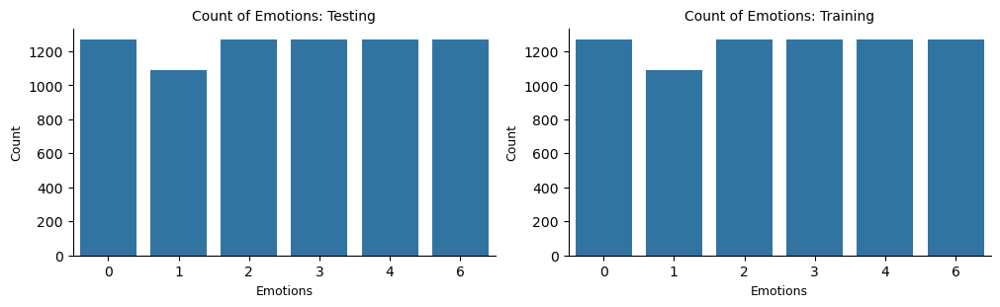

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3), constrained_layout=True) 

# Plot for Testing Data
axes[0].set_title('Count of Emotions: Testing', size=10)
sns.countplot(x=Crema_df.Emotions, ax=axes[0])
axes[0].set_ylabel('Count', size=9)
axes[0].set_xlabel('Emotions', size=9)
sns.despine(ax=axes[0], top=True, right=True, left=False, bottom=False)

# Plot for Training Data
axes[1].set_title('Count of Emotions: Training', size=10)
sns.countplot(x=Crema_df.Emotions, ax=axes[1])
axes[1].set_ylabel('Count', size=9)
axes[1].set_xlabel('Emotions', size=9)
sns.despine(ax=axes[1], top=True, right=True, left=False, bottom=False)

plt.show()

In [18]:
audio_sample = Crema_df[Crema_df.Emotions == 4].sample(1, random_state=0).iloc[0]
audio_sample

Emotions                                                    4
Path                data/Crema-D/AudioWAV/1073_IEO_DIS_HI.wav
logMel      [[-80.0, -80.0, -58.001003, -30.407433, -30.11...
Name: 6834, dtype: object

In [19]:
Audio(audio_sample['Path'])

### DataLoader

In [20]:
class getdata(Dataset):
    def __init__(self, data, labels, transform=None):
        """
        Args:
            data (list of tuples): Each element is a tuple (file_path, spectrogram_array).
            labels (list): List of integer labels corresponding to the data.
        """
        self.data = data
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Retrieve the spectrogram and label
        _, spectrogram = self.data[idx]
        label = self.labels[idx]

        # Convert to torch tensor and add channel dimension
        spectrogram = torch.tensor(spectrogram, dtype=torch.float32).unsqueeze(0)
        label = torch.tensor(label, dtype=torch.long)

        # Apply any transformation
        if self.transform:
            spectrogram = self.transform(spectrogram)

        return spectrogram, label

In [21]:
ds_train = getdata(x_train, y_train)
ds_test = getdata(x_test, y_test)
ds_val = getdata(x_val, y_val)

dl_train = DataLoader(ds_train, batch_size=2, shuffle=True)
dl_test = DataLoader(ds_test, batch_size=2, shuffle=True)
dl_val = DataLoader(ds_val, batch_size=2, shuffle=True)

In [22]:
print(ds_train.data[14][1])

[[-46.049088 -45.67167  -40.909714 ... -56.909122 -49.6758   -49.643116]
 [-46.563965 -47.184822 -42.930893 ... -57.550446 -50.003357 -48.393578]
 [-47.361694 -49.56066  -45.35511  ... -53.63828  -52.981033 -47.415688]
 ...
 [-79.99999  -79.99999  -79.99999  ... -79.6687   -79.947975 -79.99999 ]
 [-79.99999  -79.99999  -79.99999  ... -79.99999  -78.71731  -79.99999 ]
 [-79.99999  -79.99999  -79.99999  ... -79.99999  -79.99999  -78.922775]]


In [23]:
sample = ds_test.data[0][0]
Audio(sample)

### Model

In [24]:
import math

def set_parameter_requires_grad(model, feature_extracting, trainable_layers):
    if feature_extracting:
        for name, param in model.named_parameters():
            print(name)
            if name not in trainable_layers:
                param.requires_grad = False

class ResNetBlock(nn.Module):
    def __init__(self, in_ch, out_ch, stride):
        super(ResNetBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=stride, padding=1, bias=False)
        self.conv2 = nn.Conv2d(out_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=False)
        self.shortcut = nn.Conv2d(in_ch, out_ch, kernel_size=1, stride=stride, bias=False) if in_ch != out_ch else None

        self.bn1 = nn.BatchNorm2d(out_ch)
        self.bn2 = nn.BatchNorm2d(out_ch)

    def forward(self, x):
        identity = x
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        if self.shortcut:
            identity = self.shortcut(identity)
        out += identity
        return F.relu(out)

class ResNet(nn.Module):
    def __init__(self, class_num):
        super(ResNet, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(32)

        self.layer1 = ResNetBlock(32, 64, stride=1)
        self.layer2 = ResNetBlock(64, 128, stride=2)

        # Increased dropout rate
        self.dropout = nn.Dropout(0.50)
        self.fc = nn.Linear(128, class_num)

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = F.max_pool2d(x, kernel_size=3, stride=2, padding=1)

        x = self.layer1(x)
        x = self.layer2(x)

        x = F.adaptive_avg_pool2d(x, (1, 1))
        x = torch.flatten(x, 1)
        x = self.dropout(x)
        return self.fc(x)

In [25]:
def load_resnet18_audio():
  model = ResNet(len(LABELS))

  return model

In [26]:
def set_seed(seed):
    """
    Sets random seeds for reproducibility.
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


def evaluate_model(model, dataloader, criterion, device):
    """
    Evaluates the model on a given dataloader.
    """
    model.eval()  # Set model to evaluation mode
    running_loss, correct, total = 0.0, 0, 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            # Track loss and accuracy
            running_loss += loss.item()
            _, predicted = outputs.max(1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    avg_loss = running_loss / len(dataloader)
    accuracy = correct / total

    return avg_loss, accuracy


def train_model(model, dl_train, dl_val, criterion, optimizer, scheduler, device, num_epochs=10, checkpoint_dir='checkpoint', save_best=True):
    """
    Trains the model with checkpointing and validation.
    """
    model.to(device)
    best_val_loss = float('inf')

    # Ensure checkpoint directory exists
    os.makedirs(checkpoint_dir, exist_ok=True)

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")

        # Training phase
        model.train()
        running_train_loss, correct_train, total_train = 0.0, 0, 0

        for inputs, labels in tqdm(dl_train, desc="Training", leave=False):
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()  # Zero gradients
            outputs = model(inputs)  # Forward pass
            loss = criterion(outputs, labels)  # Compute loss
            loss.backward()  # Backward pass
            optimizer.step()  # Optimization step

            # Track training loss and accuracy
            running_train_loss += loss.item()
            _, predicted = outputs.max(1)
            correct_train += (predicted == labels).sum().item()
            total_train += labels.size(0)

        train_loss = running_train_loss / len(dl_train)
        train_accuracy = correct_train / total_train

        # Validation phase
        val_loss, val_accuracy = evaluate_model(model, dl_val, criterion, device)

        # Step the learning rate scheduler
        if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(val_loss)
        else:
            scheduler.step()

        # Print epoch results
        print(f"\tTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"\tValidation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.4f}")

        # Save best model
        if save_best and val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_path = os.path.join(checkpoint_dir, 'best_model_crema.pth')
            torch.save(model.state_dict(), best_model_path)
            print(f"Best model saved with validation loss: {val_loss:.4f}")

    # Load the best model (if saved)
    if save_best:
        best_model_path = os.path.join(checkpoint_dir, 'best_model_crema.pth')
        model.load_state_dict(torch.load(best_model_path))

    return model, best_val_loss, val_accuracy


In [27]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
lr = 0.0005

checkpoint_dir = 'checkpoint_crema/'
os.makedirs(checkpoint_dir, exist_ok=True)  # Ensure directory exists
checkpoint_path = os.path.join(checkpoint_dir, 'best_model_crema.pth')

In [28]:
# Multi-run training and evaluation
n_runs = 3#3
n_epochs = 70#60
best_val_loss = float('inf')  # Initialize as infinity for comparison

# Loop through runs
for run in range(n_runs):
    run_seed = 42 + run  # Seed varies for each run
    set_seed(run_seed)  # Ensure reproducibility for each run

    print(f"Run {run+1}/{n_runs}")
    print("=" * 30)

    # Initialize model and optimizer
    model = load_resnet18_audio().to(device)

    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=lr,
        weight_decay=0.001,  # Regularization already in use
        amsgrad=True
    )

    # Scheduler
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', factor=0.4, patience=4, verbose=True
    )
    # Train and validate
    model, val_loss, val_acc = train_model(
        model, dl_train, dl_val, criterion, optimizer, scheduler, device, num_epochs=n_epochs
    )

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        print(f"New best model found in Run {run+1} with validation loss: {val_loss:.4f}")
        torch.save(model.state_dict(), checkpoint_path)

    print()  # Blank line for better readability between runs

# Load the best model after all runs
print("Loading the best model for final evaluation...")
model = load_resnet18_audio()
try:
    model.load_state_dict(torch.load(checkpoint_path))
    model.to(device)

    # Evaluate on validation data
    val_loss, val_acc = evaluate_model(model, dl_val, criterion, device=device)
    print(f"Training complete! Best Val Loss = {best_val_loss:.4f}, Best Val Accuracy = {val_acc:.4f}")
except FileNotFoundError:
    print("Error: Best model checkpoint not found. Ensure training was successful.")

print("-" * 30)

Run 1/3


/home/seham/miniconda3/envs/audio/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Epoch [1/70]


	Train Loss: 1.6848, Train Accuracy: 0.2773
	Validation Loss: 1.5106, Validation Accuracy: 0.3503
Best model saved with validation loss: 1.5106
Epoch [2/70]


	Train Loss: 1.5792, Train Accuracy: 0.3379
	Validation Loss: 1.5139, Validation Accuracy: 0.3785
Epoch [3/70]


	Train Loss: 1.5582, Train Accuracy: 0.3567
	Validation Loss: 1.5078, Validation Accuracy: 0.3664
Best model saved with validation loss: 1.5078
Epoch [4/70]


	Train Loss: 1.5483, Train Accuracy: 0.3521
	Validation Loss: 1.4715, Validation Accuracy: 0.4054
Best model saved with validation loss: 1.4715
Epoch [5/70]


	Train Loss: 1.5391, Train Accuracy: 0.3585
	Validation Loss: 1.4740, Validation Accuracy: 0.3933
Epoch [6/70]


	Train Loss: 1.5256, Train Accuracy: 0.3652
	Validation Loss: 1.4856, Validation Accuracy: 0.3785
Epoch [7/70]


	Train Loss: 1.5173, Train Accuracy: 0.3682
	Validation Loss: 1.4288, Validation Accuracy: 0.4188
Best model saved with validation loss: 1.4288
Epoch [8/70]


	Train Loss: 1.5022, Train Accuracy: 0.3867
	Validation Loss: 1.5243, Validation Accuracy: 0.3772
Epoch [9/70]


	Train Loss: 1.4964, Train Accuracy: 0.3794
	Validation Loss: 1.4501, Validation Accuracy: 0.4242
Epoch [10/70]


	Train Loss: 1.4861, Train Accuracy: 0.3966
	Validation Loss: 1.4553, Validation Accuracy: 0.3973
Epoch [11/70]


	Train Loss: 1.4753, Train Accuracy: 0.4062
	Validation Loss: 1.5630, Validation Accuracy: 0.3718
Epoch [12/70]


	Train Loss: 1.4631, Train Accuracy: 0.3991
	Validation Loss: 1.3907, Validation Accuracy: 0.4376
Best model saved with validation loss: 1.3907
Epoch [13/70]


	Train Loss: 1.4501, Train Accuracy: 0.4099
	Validation Loss: 1.4062, Validation Accuracy: 0.4389
Epoch [14/70]


	Train Loss: 1.4459, Train Accuracy: 0.4157
	Validation Loss: 1.3823, Validation Accuracy: 0.4523
Best model saved with validation loss: 1.3823
Epoch [15/70]


	Train Loss: 1.4338, Train Accuracy: 0.4141
	Validation Loss: 1.3864, Validation Accuracy: 0.4497
Epoch [16/70]


	Train Loss: 1.4218, Train Accuracy: 0.4302
	Validation Loss: 1.3688, Validation Accuracy: 0.4577
Best model saved with validation loss: 1.3688
Epoch [17/70]


	Train Loss: 1.4096, Train Accuracy: 0.4306
	Validation Loss: 1.3699, Validation Accuracy: 0.4443
Epoch [18/70]


	Train Loss: 1.3981, Train Accuracy: 0.4399
	Validation Loss: 1.3681, Validation Accuracy: 0.4497
Best model saved with validation loss: 1.3681
Epoch [19/70]


	Train Loss: 1.3923, Train Accuracy: 0.4395
	Validation Loss: 1.3249, Validation Accuracy: 0.4953
Best model saved with validation loss: 1.3249
Epoch [20/70]


	Train Loss: 1.3800, Train Accuracy: 0.4454
	Validation Loss: 1.3594, Validation Accuracy: 0.4617
Epoch [21/70]


	Train Loss: 1.3685, Train Accuracy: 0.4575
	Validation Loss: 1.3890, Validation Accuracy: 0.4201
Epoch [22/70]


	Train Loss: 1.3635, Train Accuracy: 0.4484
	Validation Loss: 1.3399, Validation Accuracy: 0.4523
Epoch [23/70]


	Train Loss: 1.3566, Train Accuracy: 0.4559
	Validation Loss: 1.3290, Validation Accuracy: 0.4617
Epoch [24/70]


	Train Loss: 1.3463, Train Accuracy: 0.4705
	Validation Loss: 1.3465, Validation Accuracy: 0.4819
Epoch [25/70]


	Train Loss: 1.3025, Train Accuracy: 0.4968
	Validation Loss: 1.2970, Validation Accuracy: 0.4966
Best model saved with validation loss: 1.2970
Epoch [26/70]


	Train Loss: 1.2844, Train Accuracy: 0.4963
	Validation Loss: 1.3023, Validation Accuracy: 0.4765
Epoch [27/70]


	Train Loss: 1.2772, Train Accuracy: 0.5014
	Validation Loss: 1.2947, Validation Accuracy: 0.4993
Best model saved with validation loss: 1.2947
Epoch [28/70]


	Train Loss: 1.2622, Train Accuracy: 0.5089
	Validation Loss: 1.2902, Validation Accuracy: 0.4819
Best model saved with validation loss: 1.2902
Epoch [29/70]


	Train Loss: 1.2620, Train Accuracy: 0.5140
	Validation Loss: 1.2996, Validation Accuracy: 0.4685
Epoch [30/70]


	Train Loss: 1.2494, Train Accuracy: 0.5131
	Validation Loss: 1.3257, Validation Accuracy: 0.4819
Epoch [31/70]


	Train Loss: 1.2486, Train Accuracy: 0.5165
	Validation Loss: 1.2554, Validation Accuracy: 0.5087
Best model saved with validation loss: 1.2554
Epoch [32/70]


	Train Loss: 1.2376, Train Accuracy: 0.5229
	Validation Loss: 1.2648, Validation Accuracy: 0.4980
Epoch [33/70]


	Train Loss: 1.2414, Train Accuracy: 0.5234
	Validation Loss: 1.2720, Validation Accuracy: 0.4993
Epoch [34/70]


	Train Loss: 1.2215, Train Accuracy: 0.5195
	Validation Loss: 1.2731, Validation Accuracy: 0.4926
Epoch [35/70]


	Train Loss: 1.2241, Train Accuracy: 0.5232
	Validation Loss: 1.2959, Validation Accuracy: 0.4872
Epoch [36/70]


	Train Loss: 1.2200, Train Accuracy: 0.5240
	Validation Loss: 1.2342, Validation Accuracy: 0.5221
Best model saved with validation loss: 1.2342
Epoch [37/70]


	Train Loss: 1.2159, Train Accuracy: 0.5340
	Validation Loss: 1.2608, Validation Accuracy: 0.4953
Epoch [38/70]


	Train Loss: 1.2134, Train Accuracy: 0.5299
	Validation Loss: 1.2701, Validation Accuracy: 0.5060
Epoch [39/70]


	Train Loss: 1.1982, Train Accuracy: 0.5395
	Validation Loss: 1.2631, Validation Accuracy: 0.4926
Epoch [40/70]


	Train Loss: 1.2062, Train Accuracy: 0.5343
	Validation Loss: 1.2723, Validation Accuracy: 0.4926
Epoch [41/70]


	Train Loss: 1.1937, Train Accuracy: 0.5446
	Validation Loss: 1.2337, Validation Accuracy: 0.5262
Best model saved with validation loss: 1.2337
Epoch [42/70]


	Train Loss: 1.1910, Train Accuracy: 0.5458
	Validation Loss: 1.2442, Validation Accuracy: 0.4966
Epoch [43/70]


	Train Loss: 1.1860, Train Accuracy: 0.5437
	Validation Loss: 1.2155, Validation Accuracy: 0.5195
Best model saved with validation loss: 1.2155
Epoch [44/70]


	Train Loss: 1.1746, Train Accuracy: 0.5541
	Validation Loss: 1.2208, Validation Accuracy: 0.5235
Epoch [45/70]


	Train Loss: 1.1598, Train Accuracy: 0.5529
	Validation Loss: 1.2289, Validation Accuracy: 0.5248
Epoch [46/70]


	Train Loss: 1.1600, Train Accuracy: 0.5562
	Validation Loss: 1.2722, Validation Accuracy: 0.5181
Epoch [47/70]


	Train Loss: 1.1690, Train Accuracy: 0.5502
	Validation Loss: 1.2401, Validation Accuracy: 0.4993
Epoch [48/70]


	Train Loss: 1.1576, Train Accuracy: 0.5625
	Validation Loss: 1.2566, Validation Accuracy: 0.4819
Epoch [49/70]


	Train Loss: 1.1080, Train Accuracy: 0.5797
	Validation Loss: 1.1920, Validation Accuracy: 0.5235
Best model saved with validation loss: 1.1920
Epoch [50/70]


	Train Loss: 1.0939, Train Accuracy: 0.5882
	Validation Loss: 1.1936, Validation Accuracy: 0.5154
Epoch [51/70]


	Train Loss: 1.0904, Train Accuracy: 0.5837
	Validation Loss: 1.2175, Validation Accuracy: 0.5181
Epoch [52/70]


	Train Loss: 1.0952, Train Accuracy: 0.5782
	Validation Loss: 1.1944, Validation Accuracy: 0.5356
Epoch [53/70]


	Train Loss: 1.0702, Train Accuracy: 0.5913
	Validation Loss: 1.1917, Validation Accuracy: 0.5409
Best model saved with validation loss: 1.1917
Epoch [54/70]


	Train Loss: 1.0732, Train Accuracy: 0.5977
	Validation Loss: 1.1930, Validation Accuracy: 0.5248
Epoch [55/70]


	Train Loss: 1.0683, Train Accuracy: 0.5989
	Validation Loss: 1.1865, Validation Accuracy: 0.5369
Best model saved with validation loss: 1.1865
Epoch [56/70]


	Train Loss: 1.0560, Train Accuracy: 0.6033
	Validation Loss: 1.1933, Validation Accuracy: 0.5342
Epoch [57/70]


	Train Loss: 1.0537, Train Accuracy: 0.6058
	Validation Loss: 1.2278, Validation Accuracy: 0.5060
Epoch [58/70]


	Train Loss: 1.0563, Train Accuracy: 0.6019
	Validation Loss: 1.2027, Validation Accuracy: 0.5302
Epoch [59/70]


	Train Loss: 1.0465, Train Accuracy: 0.6055
	Validation Loss: 1.1854, Validation Accuracy: 0.5383
Best model saved with validation loss: 1.1854
Epoch [60/70]


	Train Loss: 1.0362, Train Accuracy: 0.6121
	Validation Loss: 1.1935, Validation Accuracy: 0.5490
Epoch [61/70]


	Train Loss: 1.0331, Train Accuracy: 0.6097
	Validation Loss: 1.1884, Validation Accuracy: 0.5423
Epoch [62/70]


	Train Loss: 1.0359, Train Accuracy: 0.6131
	Validation Loss: 1.1887, Validation Accuracy: 0.5329
Epoch [63/70]


	Train Loss: 1.0269, Train Accuracy: 0.6173
	Validation Loss: 1.1795, Validation Accuracy: 0.5275
Best model saved with validation loss: 1.1795
Epoch [64/70]


	Train Loss: 1.0249, Train Accuracy: 0.6137
	Validation Loss: 1.1707, Validation Accuracy: 0.5463
Best model saved with validation loss: 1.1707
Epoch [65/70]


	Train Loss: 1.0163, Train Accuracy: 0.6228
	Validation Loss: 1.2303, Validation Accuracy: 0.5262
Epoch [66/70]


	Train Loss: 1.0132, Train Accuracy: 0.6161
	Validation Loss: 1.2098, Validation Accuracy: 0.5275
Epoch [67/70]


	Train Loss: 1.0112, Train Accuracy: 0.6231
	Validation Loss: 1.1869, Validation Accuracy: 0.5221
Epoch [68/70]


	Train Loss: 1.0068, Train Accuracy: 0.6173
	Validation Loss: 1.1805, Validation Accuracy: 0.5396
Epoch [69/70]


	Train Loss: 0.9932, Train Accuracy: 0.6225
	Validation Loss: 1.2042, Validation Accuracy: 0.5436
Epoch [70/70]


	Train Loss: 0.9688, Train Accuracy: 0.6391
	Validation Loss: 1.1751, Validation Accuracy: 0.5356
New best model found in Run 1 with validation loss: 1.1707

Run 2/3
Epoch [1/70]


	Train Loss: 1.6740, Train Accuracy: 0.2927
	Validation Loss: 1.5348, Validation Accuracy: 0.3584
Best model saved with validation loss: 1.5348
Epoch [2/70]


	Train Loss: 1.5870, Train Accuracy: 0.3319
	Validation Loss: 1.4917, Validation Accuracy: 0.3906
Best model saved with validation loss: 1.4917
Epoch [3/70]


	Train Loss: 1.5630, Train Accuracy: 0.3516
	Validation Loss: 1.4897, Validation Accuracy: 0.3812
Best model saved with validation loss: 1.4897
Epoch [4/70]


	Train Loss: 1.5442, Train Accuracy: 0.3552
	Validation Loss: 1.4921, Validation Accuracy: 0.3866
Epoch [5/70]


	Train Loss: 1.5346, Train Accuracy: 0.3621
	Validation Loss: 1.4714, Validation Accuracy: 0.3866
Best model saved with validation loss: 1.4714
Epoch [6/70]


	Train Loss: 1.5219, Train Accuracy: 0.3633
	Validation Loss: 1.5022, Validation Accuracy: 0.3946
Epoch [7/70]


	Train Loss: 1.5107, Train Accuracy: 0.3739
	Validation Loss: 1.4380, Validation Accuracy: 0.4094
Best model saved with validation loss: 1.4380
Epoch [8/70]


	Train Loss: 1.5002, Train Accuracy: 0.3817
	Validation Loss: 1.4591, Validation Accuracy: 0.3879
Epoch [9/70]


	Train Loss: 1.4807, Train Accuracy: 0.3941
	Validation Loss: 1.4257, Validation Accuracy: 0.4362
Best model saved with validation loss: 1.4257
Epoch [10/70]


	Train Loss: 1.4687, Train Accuracy: 0.4002
	Validation Loss: 1.4099, Validation Accuracy: 0.4336
Best model saved with validation loss: 1.4099
Epoch [11/70]


	Train Loss: 1.4677, Train Accuracy: 0.4047
	Validation Loss: 1.5064, Validation Accuracy: 0.3839
Epoch [12/70]


	Train Loss: 1.4488, Train Accuracy: 0.4088
	Validation Loss: 1.4111, Validation Accuracy: 0.4322
Epoch [13/70]


	Train Loss: 1.4409, Train Accuracy: 0.4115
	Validation Loss: 1.4603, Validation Accuracy: 0.4081
Epoch [14/70]


	Train Loss: 1.4253, Train Accuracy: 0.4251
	Validation Loss: 1.3894, Validation Accuracy: 0.4644
Best model saved with validation loss: 1.3894
Epoch [15/70]


	Train Loss: 1.4214, Train Accuracy: 0.4263
	Validation Loss: 1.3805, Validation Accuracy: 0.4591
Best model saved with validation loss: 1.3805
Epoch [16/70]


	Train Loss: 1.4088, Train Accuracy: 0.4326
	Validation Loss: 1.4185, Validation Accuracy: 0.4201
Epoch [17/70]


	Train Loss: 1.4042, Train Accuracy: 0.4372
	Validation Loss: 1.3496, Validation Accuracy: 0.4591
Best model saved with validation loss: 1.3496
Epoch [18/70]


	Train Loss: 1.3859, Train Accuracy: 0.4392
	Validation Loss: 1.3639, Validation Accuracy: 0.4510
Epoch [19/70]


	Train Loss: 1.3776, Train Accuracy: 0.4454
	Validation Loss: 1.3637, Validation Accuracy: 0.4644
Epoch [20/70]


	Train Loss: 1.3741, Train Accuracy: 0.4506
	Validation Loss: 1.3595, Validation Accuracy: 0.4577
Epoch [21/70]


	Train Loss: 1.3618, Train Accuracy: 0.4560
	Validation Loss: 1.3539, Validation Accuracy: 0.4685
Epoch [22/70]


	Train Loss: 1.3598, Train Accuracy: 0.4663
	Validation Loss: 1.3521, Validation Accuracy: 0.4819
Epoch [23/70]


	Train Loss: 1.3087, Train Accuracy: 0.4866
	Validation Loss: 1.3205, Validation Accuracy: 0.4846
Best model saved with validation loss: 1.3205
Epoch [24/70]


	Train Loss: 1.2970, Train Accuracy: 0.4943
	Validation Loss: 1.3579, Validation Accuracy: 0.4523
Epoch [25/70]


	Train Loss: 1.2879, Train Accuracy: 0.4956
	Validation Loss: 1.2881, Validation Accuracy: 0.4846
Best model saved with validation loss: 1.2881
Epoch [26/70]


	Train Loss: 1.2803, Train Accuracy: 0.4965
	Validation Loss: 1.2847, Validation Accuracy: 0.4966
Best model saved with validation loss: 1.2847
Epoch [27/70]


	Train Loss: 1.2813, Train Accuracy: 0.5043
	Validation Loss: 1.3046, Validation Accuracy: 0.4859
Epoch [28/70]


	Train Loss: 1.2741, Train Accuracy: 0.4969
	Validation Loss: 1.2856, Validation Accuracy: 0.4899
Epoch [29/70]


	Train Loss: 1.2619, Train Accuracy: 0.5043
	Validation Loss: 1.3100, Validation Accuracy: 0.4872
Epoch [30/70]


	Train Loss: 1.2608, Train Accuracy: 0.5108
	Validation Loss: 1.2719, Validation Accuracy: 0.5114
Best model saved with validation loss: 1.2719
Epoch [31/70]


	Train Loss: 1.2414, Train Accuracy: 0.5187
	Validation Loss: 1.2760, Validation Accuracy: 0.4993
Epoch [32/70]


	Train Loss: 1.2422, Train Accuracy: 0.5207
	Validation Loss: 1.2625, Validation Accuracy: 0.5087
Best model saved with validation loss: 1.2625
Epoch [33/70]


	Train Loss: 1.2302, Train Accuracy: 0.5228
	Validation Loss: 1.2883, Validation Accuracy: 0.4779
Epoch [34/70]


	Train Loss: 1.2311, Train Accuracy: 0.5153
	Validation Loss: 1.2642, Validation Accuracy: 0.5101
Epoch [35/70]


	Train Loss: 1.2308, Train Accuracy: 0.5228
	Validation Loss: 1.2436, Validation Accuracy: 0.5221
Best model saved with validation loss: 1.2436
Epoch [36/70]


	Train Loss: 1.2240, Train Accuracy: 0.5326
	Validation Loss: 1.2964, Validation Accuracy: 0.4886
Epoch [37/70]


	Train Loss: 1.2144, Train Accuracy: 0.5317
	Validation Loss: 1.2527, Validation Accuracy: 0.5034
Epoch [38/70]


	Train Loss: 1.2139, Train Accuracy: 0.5289
	Validation Loss: 1.2304, Validation Accuracy: 0.5235
Best model saved with validation loss: 1.2304
Epoch [39/70]


	Train Loss: 1.1975, Train Accuracy: 0.5364
	Validation Loss: 1.2596, Validation Accuracy: 0.5141
Epoch [40/70]


	Train Loss: 1.1969, Train Accuracy: 0.5401
	Validation Loss: 1.2387, Validation Accuracy: 0.5154
Epoch [41/70]


	Train Loss: 1.2001, Train Accuracy: 0.5322
	Validation Loss: 1.2610, Validation Accuracy: 0.5047
Epoch [42/70]


	Train Loss: 1.1801, Train Accuracy: 0.5449
	Validation Loss: 1.2327, Validation Accuracy: 0.5168
Epoch [43/70]


	Train Loss: 1.1798, Train Accuracy: 0.5435
	Validation Loss: 1.2839, Validation Accuracy: 0.4926
Epoch [44/70]


	Train Loss: 1.1421, Train Accuracy: 0.5643
	Validation Loss: 1.2329, Validation Accuracy: 0.5342
Epoch [45/70]


	Train Loss: 1.1247, Train Accuracy: 0.5746
	Validation Loss: 1.2027, Validation Accuracy: 0.5530
Best model saved with validation loss: 1.2027
Epoch [46/70]


	Train Loss: 1.1078, Train Accuracy: 0.5809
	Validation Loss: 1.1998, Validation Accuracy: 0.5450
Best model saved with validation loss: 1.1998
Epoch [47/70]


	Train Loss: 1.1066, Train Accuracy: 0.5770
	Validation Loss: 1.2445, Validation Accuracy: 0.5047
Epoch [48/70]


	Train Loss: 1.1041, Train Accuracy: 0.5812
	Validation Loss: 1.2295, Validation Accuracy: 0.5248
Epoch [49/70]


	Train Loss: 1.0994, Train Accuracy: 0.5840
	Validation Loss: 1.1974, Validation Accuracy: 0.5369
Best model saved with validation loss: 1.1974
Epoch [50/70]


	Train Loss: 1.0959, Train Accuracy: 0.5812
	Validation Loss: 1.1939, Validation Accuracy: 0.5423
Best model saved with validation loss: 1.1939
Epoch [51/70]


	Train Loss: 1.0846, Train Accuracy: 0.5935
	Validation Loss: 1.2086, Validation Accuracy: 0.5342
Epoch [52/70]


	Train Loss: 1.0821, Train Accuracy: 0.5928
	Validation Loss: 1.2194, Validation Accuracy: 0.5114
Epoch [53/70]


	Train Loss: 1.0638, Train Accuracy: 0.6004
	Validation Loss: 1.1874, Validation Accuracy: 0.5329
Best model saved with validation loss: 1.1874
Epoch [54/70]


	Train Loss: 1.0805, Train Accuracy: 0.5891
	Validation Loss: 1.1979, Validation Accuracy: 0.5342
Epoch [55/70]


	Train Loss: 1.0684, Train Accuracy: 0.5964
	Validation Loss: 1.1891, Validation Accuracy: 0.5369
Epoch [56/70]


	Train Loss: 1.0635, Train Accuracy: 0.6003
	Validation Loss: 1.1834, Validation Accuracy: 0.5383
Best model saved with validation loss: 1.1834
Epoch [57/70]


	Train Loss: 1.0477, Train Accuracy: 0.6086
	Validation Loss: 1.1984, Validation Accuracy: 0.5396
Epoch [58/70]


	Train Loss: 1.0401, Train Accuracy: 0.6109
	Validation Loss: 1.2125, Validation Accuracy: 0.5356
Epoch [59/70]


	Train Loss: 1.0429, Train Accuracy: 0.6049
	Validation Loss: 1.2028, Validation Accuracy: 0.5396
Epoch [60/70]


	Train Loss: 1.0328, Train Accuracy: 0.6071
	Validation Loss: 1.1906, Validation Accuracy: 0.5436
Epoch [61/70]


	Train Loss: 1.0397, Train Accuracy: 0.6094
	Validation Loss: 1.2261, Validation Accuracy: 0.5289
Epoch [62/70]


	Train Loss: 1.0032, Train Accuracy: 0.6297
	Validation Loss: 1.1914, Validation Accuracy: 0.5369
Epoch [63/70]


	Train Loss: 0.9930, Train Accuracy: 0.6258
	Validation Loss: 1.1717, Validation Accuracy: 0.5369
Best model saved with validation loss: 1.1717
Epoch [64/70]


	Train Loss: 0.9878, Train Accuracy: 0.6345
	Validation Loss: 1.1893, Validation Accuracy: 0.5289
Epoch [65/70]


	Train Loss: 0.9803, Train Accuracy: 0.6330
	Validation Loss: 1.1877, Validation Accuracy: 0.5436
Epoch [66/70]


	Train Loss: 0.9773, Train Accuracy: 0.6397
	Validation Loss: 1.1921, Validation Accuracy: 0.5450
Epoch [67/70]


	Train Loss: 0.9731, Train Accuracy: 0.6412
	Validation Loss: 1.1849, Validation Accuracy: 0.5436
Epoch [68/70]


	Train Loss: 0.9795, Train Accuracy: 0.6416
	Validation Loss: 1.1812, Validation Accuracy: 0.5423
Epoch [69/70]


	Train Loss: 0.9495, Train Accuracy: 0.6485
	Validation Loss: 1.1850, Validation Accuracy: 0.5396
Epoch [70/70]


	Train Loss: 0.9488, Train Accuracy: 0.6463
	Validation Loss: 1.1843, Validation Accuracy: 0.5396

Run 3/3
Epoch [1/70]


	Train Loss: 1.6867, Train Accuracy: 0.2801
	Validation Loss: 1.8263, Validation Accuracy: 0.2443
Best model saved with validation loss: 1.8263
Epoch [2/70]


	Train Loss: 1.5864, Train Accuracy: 0.3330
	Validation Loss: 1.5076, Validation Accuracy: 0.3705
Best model saved with validation loss: 1.5076
Epoch [3/70]


	Train Loss: 1.5641, Train Accuracy: 0.3460
	Validation Loss: 1.5024, Validation Accuracy: 0.4000
Best model saved with validation loss: 1.5024
Epoch [4/70]


	Train Loss: 1.5438, Train Accuracy: 0.3537
	Validation Loss: 1.4869, Validation Accuracy: 0.3960
Best model saved with validation loss: 1.4869
Epoch [5/70]


	Train Loss: 1.5326, Train Accuracy: 0.3590
	Validation Loss: 1.4723, Validation Accuracy: 0.4000
Best model saved with validation loss: 1.4723
Epoch [6/70]


	Train Loss: 1.5162, Train Accuracy: 0.3702
	Validation Loss: 1.4656, Validation Accuracy: 0.4081
Best model saved with validation loss: 1.4656
Epoch [7/70]


	Train Loss: 1.4999, Train Accuracy: 0.3761
	Validation Loss: 1.5114, Validation Accuracy: 0.3732
Epoch [8/70]


	Train Loss: 1.4940, Train Accuracy: 0.3823
	Validation Loss: 1.4810, Validation Accuracy: 0.4081
Epoch [9/70]


	Train Loss: 1.4800, Train Accuracy: 0.3967
	Validation Loss: 1.4671, Validation Accuracy: 0.3893
Epoch [10/70]


	Train Loss: 1.4679, Train Accuracy: 0.4000
	Validation Loss: 1.4348, Validation Accuracy: 0.4054
Best model saved with validation loss: 1.4348
Epoch [11/70]


	Train Loss: 1.4640, Train Accuracy: 0.4026
	Validation Loss: 1.4055, Validation Accuracy: 0.4188
Best model saved with validation loss: 1.4055
Epoch [12/70]


	Train Loss: 1.4499, Train Accuracy: 0.4048
	Validation Loss: 1.3842, Validation Accuracy: 0.4537
Best model saved with validation loss: 1.3842
Epoch [13/70]


	Train Loss: 1.4350, Train Accuracy: 0.4087
	Validation Loss: 1.4084, Validation Accuracy: 0.4134
Epoch [14/70]


	Train Loss: 1.4162, Train Accuracy: 0.4300
	Validation Loss: 1.3719, Validation Accuracy: 0.4537
Best model saved with validation loss: 1.3719
Epoch [15/70]


	Train Loss: 1.4110, Train Accuracy: 0.4300
	Validation Loss: 1.4848, Validation Accuracy: 0.4174
Epoch [16/70]


	Train Loss: 1.4022, Train Accuracy: 0.4395
	Validation Loss: 1.3646, Validation Accuracy: 0.4309
Best model saved with validation loss: 1.3646
Epoch [17/70]


	Train Loss: 1.3920, Train Accuracy: 0.4414
	Validation Loss: 1.3541, Validation Accuracy: 0.4550
Best model saved with validation loss: 1.3541
Epoch [18/70]


	Train Loss: 1.3847, Train Accuracy: 0.4492
	Validation Loss: 1.3419, Validation Accuracy: 0.4537
Best model saved with validation loss: 1.3419
Epoch [19/70]


	Train Loss: 1.3730, Train Accuracy: 0.4495
	Validation Loss: 1.3291, Validation Accuracy: 0.4899
Best model saved with validation loss: 1.3291
Epoch [20/70]


	Train Loss: 1.3737, Train Accuracy: 0.4515
	Validation Loss: 1.3249, Validation Accuracy: 0.4792
Best model saved with validation loss: 1.3249
Epoch [21/70]


	Train Loss: 1.3571, Train Accuracy: 0.4604
	Validation Loss: 1.3375, Validation Accuracy: 0.4792
Epoch [22/70]


	Train Loss: 1.3555, Train Accuracy: 0.4698
	Validation Loss: 1.3397, Validation Accuracy: 0.4711
Epoch [23/70]


	Train Loss: 1.3454, Train Accuracy: 0.4613
	Validation Loss: 1.3486, Validation Accuracy: 0.4537
Epoch [24/70]


	Train Loss: 1.3415, Train Accuracy: 0.4674
	Validation Loss: 1.3818, Validation Accuracy: 0.4282
Epoch [25/70]


	Train Loss: 1.3410, Train Accuracy: 0.4639
	Validation Loss: 1.3325, Validation Accuracy: 0.4685
Epoch [26/70]


	Train Loss: 1.2927, Train Accuracy: 0.4956
	Validation Loss: 1.2755, Validation Accuracy: 0.5168
Best model saved with validation loss: 1.2755
Epoch [27/70]


	Train Loss: 1.2728, Train Accuracy: 0.5069
	Validation Loss: 1.2749, Validation Accuracy: 0.5087
Best model saved with validation loss: 1.2749
Epoch [28/70]


	Train Loss: 1.2631, Train Accuracy: 0.5083
	Validation Loss: 1.2503, Validation Accuracy: 0.5208
Best model saved with validation loss: 1.2503
Epoch [29/70]


	Train Loss: 1.2517, Train Accuracy: 0.5096
	Validation Loss: 1.2739, Validation Accuracy: 0.5114
Epoch [30/70]


	Train Loss: 1.2556, Train Accuracy: 0.5131
	Validation Loss: 1.2742, Validation Accuracy: 0.5262
Epoch [31/70]


	Train Loss: 1.2439, Train Accuracy: 0.5186
	Validation Loss: 1.2424, Validation Accuracy: 0.5195
Best model saved with validation loss: 1.2424
Epoch [32/70]


	Train Loss: 1.2332, Train Accuracy: 0.5181
	Validation Loss: 1.2613, Validation Accuracy: 0.5289
Epoch [33/70]


	Train Loss: 1.2326, Train Accuracy: 0.5217
	Validation Loss: 1.2629, Validation Accuracy: 0.5034
Epoch [34/70]


	Train Loss: 1.2301, Train Accuracy: 0.5240
	Validation Loss: 1.2374, Validation Accuracy: 0.5168
Best model saved with validation loss: 1.2374
Epoch [35/70]


	Train Loss: 1.2289, Train Accuracy: 0.5180
	Validation Loss: 1.2603, Validation Accuracy: 0.5087
Epoch [36/70]


	Train Loss: 1.2232, Train Accuracy: 0.5250
	Validation Loss: 1.2281, Validation Accuracy: 0.5329
Best model saved with validation loss: 1.2281
Epoch [37/70]


	Train Loss: 1.2103, Train Accuracy: 0.5326
	Validation Loss: 1.2332, Validation Accuracy: 0.5114
Epoch [38/70]


	Train Loss: 1.2091, Train Accuracy: 0.5235
	Validation Loss: 1.2674, Validation Accuracy: 0.5020
Epoch [39/70]


	Train Loss: 1.2036, Train Accuracy: 0.5338
	Validation Loss: 1.2798, Validation Accuracy: 0.4899
Epoch [40/70]


	Train Loss: 1.1994, Train Accuracy: 0.5429
	Validation Loss: 1.2437, Validation Accuracy: 0.5195
Epoch [41/70]


	Train Loss: 1.1877, Train Accuracy: 0.5408
	Validation Loss: 1.2128, Validation Accuracy: 0.5101
Best model saved with validation loss: 1.2128
Epoch [42/70]


	Train Loss: 1.1882, Train Accuracy: 0.5413
	Validation Loss: 1.2586, Validation Accuracy: 0.4980
Epoch [43/70]


	Train Loss: 1.1789, Train Accuracy: 0.5401
	Validation Loss: 1.1992, Validation Accuracy: 0.5289
Best model saved with validation loss: 1.1992
Epoch [44/70]


	Train Loss: 1.1795, Train Accuracy: 0.5422
	Validation Loss: 1.2129, Validation Accuracy: 0.5342
Epoch [45/70]


	Train Loss: 1.1703, Train Accuracy: 0.5601
	Validation Loss: 1.2097, Validation Accuracy: 0.5302
Epoch [46/70]


	Train Loss: 1.1598, Train Accuracy: 0.5502
	Validation Loss: 1.2273, Validation Accuracy: 0.5396
Epoch [47/70]


	Train Loss: 1.1591, Train Accuracy: 0.5522
	Validation Loss: 1.1989, Validation Accuracy: 0.5436
Best model saved with validation loss: 1.1989
Epoch [48/70]


	Train Loss: 1.1525, Train Accuracy: 0.5576
	Validation Loss: 1.2261, Validation Accuracy: 0.5275
Epoch [49/70]


	Train Loss: 1.1473, Train Accuracy: 0.5589
	Validation Loss: 1.2006, Validation Accuracy: 0.5315
Epoch [50/70]


	Train Loss: 1.1432, Train Accuracy: 0.5632
	Validation Loss: 1.2420, Validation Accuracy: 0.4926
Epoch [51/70]


	Train Loss: 1.1462, Train Accuracy: 0.5577
	Validation Loss: 1.1980, Validation Accuracy: 0.5275
Best model saved with validation loss: 1.1980
Epoch [52/70]


	Train Loss: 1.1332, Train Accuracy: 0.5685
	Validation Loss: 1.1870, Validation Accuracy: 0.5289
Best model saved with validation loss: 1.1870
Epoch [53/70]


	Train Loss: 1.1247, Train Accuracy: 0.5686
	Validation Loss: 1.2605, Validation Accuracy: 0.4886
Epoch [54/70]


	Train Loss: 1.1205, Train Accuracy: 0.5792
	Validation Loss: 1.2329, Validation Accuracy: 0.5128
Epoch [55/70]


	Train Loss: 1.1111, Train Accuracy: 0.5795
	Validation Loss: 1.1805, Validation Accuracy: 0.5329
Best model saved with validation loss: 1.1805
Epoch [56/70]


	Train Loss: 1.1176, Train Accuracy: 0.5768
	Validation Loss: 1.2086, Validation Accuracy: 0.5289
Epoch [57/70]


	Train Loss: 1.1106, Train Accuracy: 0.5782
	Validation Loss: 1.2198, Validation Accuracy: 0.5168
Epoch [58/70]


	Train Loss: 1.1029, Train Accuracy: 0.5770
	Validation Loss: 1.2721, Validation Accuracy: 0.5154
Epoch [59/70]


	Train Loss: 1.0949, Train Accuracy: 0.5849
	Validation Loss: 1.2028, Validation Accuracy: 0.5369
Epoch [60/70]


	Train Loss: 1.0888, Train Accuracy: 0.5837
	Validation Loss: 1.2039, Validation Accuracy: 0.5423
Epoch [61/70]


	Train Loss: 1.0294, Train Accuracy: 0.6112
	Validation Loss: 1.1715, Validation Accuracy: 0.5570
Best model saved with validation loss: 1.1715
Epoch [62/70]


	Train Loss: 1.0177, Train Accuracy: 0.6234
	Validation Loss: 1.1934, Validation Accuracy: 0.5342
Epoch [63/70]


	Train Loss: 1.0109, Train Accuracy: 0.6191
	Validation Loss: 1.1514, Validation Accuracy: 0.5691
Best model saved with validation loss: 1.1514
Epoch [64/70]


	Train Loss: 1.0067, Train Accuracy: 0.6203
	Validation Loss: 1.1714, Validation Accuracy: 0.5611
Epoch [65/70]


	Train Loss: 0.9955, Train Accuracy: 0.6291
	Validation Loss: 1.1596, Validation Accuracy: 0.5544
Epoch [66/70]


	Train Loss: 0.9863, Train Accuracy: 0.6340
	Validation Loss: 1.1850, Validation Accuracy: 0.5436
Epoch [67/70]


	Train Loss: 0.9793, Train Accuracy: 0.6330
	Validation Loss: 1.1441, Validation Accuracy: 0.5638
Best model saved with validation loss: 1.1441
Epoch [68/70]


	Train Loss: 0.9797, Train Accuracy: 0.6357
	Validation Loss: 1.1436, Validation Accuracy: 0.5651
Best model saved with validation loss: 1.1436
Epoch [69/70]


	Train Loss: 0.9757, Train Accuracy: 0.6334
	Validation Loss: 1.1490, Validation Accuracy: 0.5664
Epoch [70/70]


	Train Loss: 0.9622, Train Accuracy: 0.6424
	Validation Loss: 1.1758, Validation Accuracy: 0.5356
New best model found in Run 3 with validation loss: 1.1436

Loading the best model for final evaluation...
Training complete! Best Val Loss = 1.1436, Best Val Accuracy = 0.5651
------------------------------


In [33]:
# To load the best model:
model = load_resnet18_audio()
model.load_state_dict(torch.load(checkpoint_path))
model.to('cuda')

ResNet(
  (conv1): Conv2d(1, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): ResNetBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (shortcut): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (layer2): ResNetBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (shortcut): Conv2d(64, 128, kernel_size=(1, 1), stride=(2, 2), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, af

In [34]:
train_loss, train_acc = evaluate_model(model, dl_train, criterion, device)
print(f"Test Loss = {train_loss:.4f}, train Accuracy = {train_acc:.4f}")

val_loss, val_acc = evaluate_model(model, dl_val, criterion, device)
print(f"Test Loss = {val_loss:.4f}, val Accuracy = {val_acc:.4f}")

test_loss, test_acc = evaluate_model(model, dl_test, criterion, device)
print(f"Test Loss = {test_loss:.4f}, Test Accuracy = {test_acc:.4f}")

Test Loss = 0.8689, train Accuracy = 0.6864
Test Loss = 1.1454, val Accuracy = 0.5651
Test Loss = 1.1439, Test Accuracy = 0.5651


## ____________________________________________

In [35]:
classes = 7
model = ResNet(classes)
checkpoint_path = "checkpoint/best_model_crema.pth"
checkpoint = torch.load(checkpoint_path)
model.load_state_dict(checkpoint)
model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(1, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): ResNetBlock(
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (shortcut): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (layer2): ResNetBlock(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (shortcut): Conv2d(64, 128, kernel_size=(1, 1), stride=(2, 2), bias=False)
    (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, af

In [36]:
x_train,  x_val, y_train, y_val, x_train_v, x_test, y_train_v, y_test = data_split("Crema")

ds_train = getdata(x_train, y_train)
ds_test = getdata(x_test, y_test)
ds_val = getdata(x_val, y_val)

dl_train = DataLoader(ds_train, batch_size=2, shuffle=True)
dl_test = DataLoader(ds_test, batch_size=2, shuffle=True)
dl_val = DataLoader(ds_val, batch_size=2, shuffle=True)

NameError: name 'data_split' is not defined

In [37]:
import sys
sys.path.append('../../')

In [ ]:
from crp.crp.attribution import CondAttribution
from crp.crp.concepts import ChannelConcept
from crp.crp.helper import get_layer_names

from zennit.composites import EpsilonPlusFlat
from zennit.canonizers import SequentialMergeBatchNorm

from crp.crp.visualization import FeatureVisualization
from crp.crp.image import plot_grid, imgify

: 

In [ ]:
cc = ChannelConcept()

In [ ]:
# mask channel 0 and 2 in batch 0
mask_fn = cc.mask(0, [0, 2])
print(mask_fn)

<function ChannelConcept.mask.<locals>.mask_fct at 0x7f631d1bad40>


In [ ]:
mask_fn(torch.ones((2, 4, 2, 2)))

tensor([[[[1., 1.],
          [1., 1.]],

         [[0., 0.],
          [0., 0.]],

         [[1., 1.],
          [1., 1.]],

         [[0., 0.],
          [0., 0.]]],


        [[[1., 1.],
          [1., 1.]],

         [[1., 1.],
          [1., 1.]],

         [[1., 1.],
          [1., 1.]],

         [[1., 1.],
          [1., 1.]]]])

In [ ]:
sample = ds_test.data[100][1]
label = ds_test.labels[100]

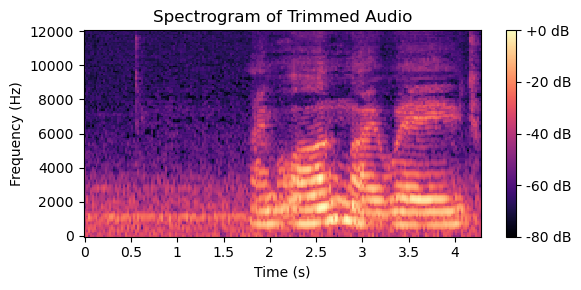

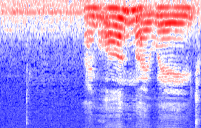

In [ ]:
plt.figure(figsize=(6, 3))
librosa.display.specshow(sample, sr=24000, x_axis='time', y_axis='hz', cmap='magma')
plt.colorbar(format="%+2.0f dB")
plt.title("Spectrogram of Trimmed Audio")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.tight_layout()
plt.show()
imgify(sample)
#print(sample.size, type(sample), sample.shape)

In [ ]:
from zennit.torchvision import ResNetCanonizer
canonizers = [ResNetCanonizer()]
composite = EpsilonPlusFlat(canonizers)

In [ ]:
# describes how the attributions should be computed on the dataset
attribution = CondAttribution(model, no_param_grad=True)

In [ ]:
from crp.crp.helper import get_layer_names
# compute heatmap wrt. output 0 
'''0:'fear', 1:'neutral', 2:'happy',3:'angry', 4:'disgust', 5:'surprise',6:'sad'''

selected_value = 'disgust'
conditions = [{"y": label}]

sample = torch.tensor(sample, dtype=torch.float32, requires_grad=True).squeeze(0).to(device) #  add batch and channel dimensions

attr = attribution(sample, conditions, composite, mask_map=cc.mask)

/tmp/ipykernel_1104380/3999869874.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  sample = torch.tensor(sample, dtype=torch.float32, requires_grad=True).squeeze(0).to(device) #  add batch and channel dimensions


In [ ]:
layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])
layer_names

['conv1',
 'layer1.conv1',
 'layer1.conv2',
 'layer1.shortcut',
 'layer2.conv1',
 'layer2.conv2',
 'layer2.shortcut',
 'fc']

In [ ]:
# or use a dictionary for mask_map
'''layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])
mask_map = {name: cc.mask for name in layer_names}

attr = attribution(sample, conditions, composite, mask_map=mask_map)'''

'layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])\nmask_map = {name: cc.mask for name in layer_names}\n\nattr = attribution(sample, conditions, composite, mask_map=mask_map)'

In [ ]:
print( attr.heatmap)

imgify(attr.heatmap, symmetric=False)

tensor([[[ 6.5566e-03,  8.1667e-03,  8.1667e-03,  ...,  7.7723e-03,
           7.7723e-03,  6.2986e-03],
         [ 8.6338e-03,  1.0313e-02,  1.0313e-02,  ...,  8.1008e-03,
           8.1008e-03,  6.6271e-03],
         [ 8.6338e-03,  1.0313e-02,  1.0313e-02,  ...,  8.1008e-03,
           8.1008e-03,  6.6271e-03],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  1.1604e-03,
           1.1604e-03,  7.3815e-04],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  8.0866e-04,
           8.0866e-04,  5.3275e-04],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  8.0866e-04,
           8.0866e-04,  5.3275e-04]],

        [[ 3.2970e-04,  4.0636e-04,  4.0636e-04,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 4.4044e-04,  5.2123e-04,  5.2123e-04,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 4.4044e-04,  5.2123e-04,  5.2123e-04,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         ...,
         [ 0.0000e+00,  0

TypeError: Last (or first) axis of input are color channels, which have to either be 1, 3 or be omitted entirely!

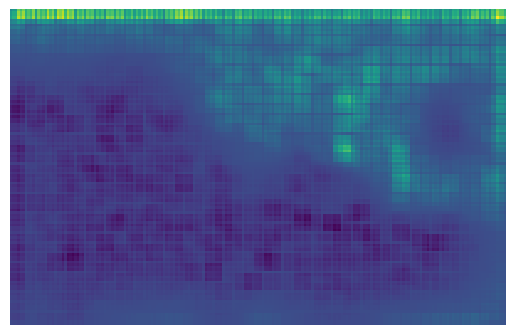

In [ ]:
# Convert tensor to numpy array and remove batch and channel dimensions
tensor = attr.heatmap
tensor_numpy = tensor.squeeze().cpu().numpy()

# Plotting the tensor as an image
plt.imshow(tensor_numpy, cmap='viridis', interpolation='nearest')
plt.axis('off')  # Turn off axis
plt.show()

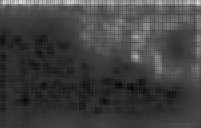

In [ ]:
from PIL import Image
import numpy as np

# Assuming your tensor is named 'tensor'
tensor = tensor.cpu().squeeze()  # Move tensor to CPU and remove the extra dimensions (if any)

# Convert tensor to numpy array
numpy_image = tensor.detach().numpy()

# Normalize the image to 0-255 if required
# You can adjust the normalization based on your data, this is an example:
numpy_image = (numpy_image - numpy_image.min()) / (numpy_image.max() - numpy_image.min()) * 255
numpy_image = np.uint8(numpy_image)

# Convert numpy array to PIL Image
pil_image = Image.fromarray(numpy_image)

# Show the image
pil_image.show()


hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000,  1.6229,  0.0000,  ...,  0.0000,  0.1357,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1725, -0.1711,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0824,  0.1252,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.1570,  0.0000,  ...,  0.0000,  0.5506,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0148,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000, 

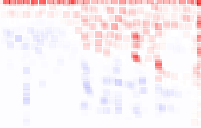

In [ ]:
# compute heatmap of channel 35 in layer features.40 conditioned on output 46 (green lizard class) 
conditions = [{"y": [4], "conv1": [12]}]
heatmap, _, _, _ = attribution(sample, conditions, composite)

imgify(heatmap, symmetric=True)

hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0205,  0.0205,  0.0205,  ...,  0.0205,  0.0205, 

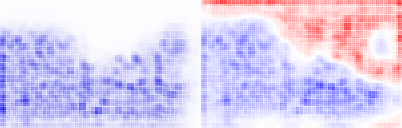

In [ ]:
conditions = [{"layer2.conv2": [35], "y": [4]}, {"layer1.conv2": [10], "y": [4]}]
heatmaps, _, _, _ = attribution(sample, conditions, composite)

imgify(heatmaps, symmetric=True, grid=(1, len(heatmaps)))

Initializing Relevance

hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
            0.0000e+00, -2.2203e-04],
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
            0.0000e+00,  0.0000e+00],
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
            0.0000e+00,  0.0000e+00],
          ...,
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
            0.0000e+00,  0.0000e+00],
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
            0.0000e+00,  0.0000e+00],
          [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
            0.0000e+00,  0.0000e+00]],

         [[-6.0102e-02, -1.3177e-01, -2.0178e-01,  ..., -1.7271e-01,
           -1.6302e-01, -9.6022e-02],
          [-7.1443e-02, -1.5907e-01, -2.2303e-01,  ..., -2.2344e-01,
           -2.2739e-01, -1.5545e-01],
          [-2.2987e-02, -5.5112e-02, -7.2024e-02,  ..., -1.0940e-01,
           -1.1375

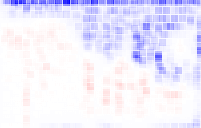

In [ ]:
conditions = [{"y": [4], "layer1.conv1": [35]}]
heatmap, _, _, _ = attribution(sample, conditions, composite, init_rel=-1)

imgify(heatmap, symmetric=True)

hello from mask
wrt. class 3
hello from mask_fct, 
  tensor([[[[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 1.1819e-02],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00]],

         [[2.1421e+00, 5.0254e+00, 7.6670e+00,  ..., 7.9281e+00,
           7.9433e+00, 4.6722e+00],
          [2.4234e+00, 5.8998e+00, 8.2111e+00,  ..., 1.0385e+01,
           1.1173e+01, 7.4981e+00],
          [6.6117e-01, 1.8991e+00, 2.5156e+00,  ..., 4.9963e+00,
           5.5532e+00, 4.1769e+00],
          ...,
      

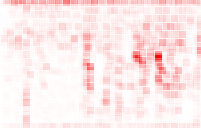

In [ ]:
softmax = torch.nn.Softmax(dim=-1)
def select_max(pred):
    id = softmax(pred).argmax(-1).item()
    print(f"wrt. class {id}")
    mask = torch.zeros_like(pred)
    mask[0, id] = pred[0, id]
    return mask

conditions = [{"layer1.conv1": [35]}]
heatmap, _, _, _ = attribution(sample, conditions, composite, init_rel=select_max)
imgify(heatmap, symmetric=True)

hello from mask
hello from mask_fct, 
  tensor([[[[-6.4687e-01, -3.3140e-01, -2.7864e-01,  ..., -2.6861e-01,
           -7.7319e-01,  2.6796e-02],
          [-8.3281e-01, -6.9753e-01, -5.7797e-01,  ..., -9.4112e-01,
           -1.2138e+00, -2.2546e-01],
          [-8.1351e-01, -5.6199e-01, -5.6446e-01,  ..., -9.9594e-01,
           -1.0576e+00, -2.4566e-01],
          ...,
          [-1.9993e+00, -2.4777e+00, -1.8678e+00,  ..., -1.9039e+00,
           -2.8196e+00, -1.8502e+00],
          [-2.3174e+00, -2.3350e+00, -1.9542e+00,  ..., -2.3023e+00,
           -3.3421e+00, -1.8270e+00],
          [-1.6418e+00, -1.7819e+00, -1.5680e+00,  ..., -1.5564e+00,
           -2.1046e+00, -1.4448e+00]],

         [[ 1.7775e+00,  2.5473e+00,  2.4947e+00,  ...,  2.8583e+00,
            2.7777e+00,  2.4512e+00],
          [ 2.0549e+00,  2.6679e+00,  2.5155e+00,  ...,  2.9588e+00,
            3.0118e+00,  2.7719e+00],
          [ 1.1737e+00,  1.3840e+00,  1.3303e+00,  ...,  2.1254e+00,
            2.1608

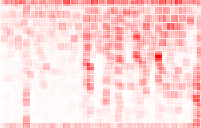

In [ ]:
conditions = [{"layer1.conv1": [35]}]

heatmap, _, _, _ = attribution(sample, conditions, composite, start_layer="layer1.conv1")

imgify(heatmap, symmetric=True)

Recording and Attributing Latent Concept Relevances

In [ ]:
from crp.crp.helper import get_layer_names

layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])

conditions = [{'y': label}]
attr = attribution(sample, conditions, composite, record_layer=layer_names)

attr.activations['layer2.conv2'].shape, attr.relevances['layer2.conv2'].shape

(torch.Size([1, 128, 16, 26]), torch.Size([1, 128, 16, 26]))

In [ ]:
rel_c = cc.attribute(attr.relevances['layer2.conv2'], abs_norm=True)
rel_c.shape

torch.Size([1, 128])

In [ ]:
# the six most relevant concepts and their contribution to final classification in percent
rel_values, concept_ids = torch.topk(rel_c[0], 6)
print(rel_values)
concept_ids, rel_values*100

tensor([0.0492, 0.0345, 0.0319, 0.0310, 0.0301, 0.0279], device='cuda:0')


(tensor([112, 103,  93,  41, 111,  23], device='cuda:0'),
 tensor([4.9155, 3.4509, 3.1859, 3.1048, 3.0108, 2.7927], device='cuda:0'))

hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.

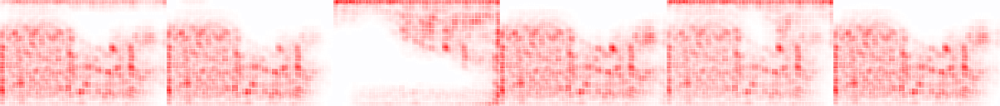

In [ ]:
conditions = [{'layer2.conv2': [id], 'y': label} for id in concept_ids]

heatmap, _, _, _ = attribution(sample, conditions, composite)

imgify(heatmap, symmetric=True, grid=(1, len(concept_ids)))

Conditions with Several Layers

In [ ]:
conditions = [{"layer2.conv2": [35], "layer1.conv2": [24], "y": label}]

In [ ]:
attr = attribution(sample, conditions, composite, exclude_parallel=True)

hello from mask
hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0205,  0.0205,  0.0205,  ...,  0

Generator Expression for Maximal Performance

In [ ]:
conditions = [{'layer2.conv2': [id], 'y': label} for id in torch.arange(0, 128)]

for attr in attribution.generate(sample, conditions, composite, record_layer=layer_names, batch_size=10):
    pass

  0%|          | 0/13 [00:00<?, ?it/s]

hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0

 15%|█▌        | 2/13 [00:01<00:08,  1.36it/s]

tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  

 23%|██▎       | 3/13 [00:02<00:10,  1.04s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 31%|███       | 4/13 [00:04<00:10,  1.17s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 38%|███▊      | 5/13 [00:05<00:10,  1.25s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 46%|████▌     | 6/13 [00:07<00:09,  1.32s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 54%|█████▍    | 7/13 [00:08<00:08,  1.40s/it]

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0., 

 62%|██████▏   | 8/13 [00:10<00:07,  1.42s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 69%|██████▉   | 9/13 [00:11<00:05,  1.44s/it]

hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask_fct, 
  tensor([[[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000],
          [-0.1120, -0.1120, -0.1120,  ...,  0.0000,  0.0000,  0.0000]],

         [[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0

 77%|███████▋  | 10/13 [00:13<00:04,  1.42s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 85%|████████▍ | 11/13 [00:14<00:02,  1.41s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

 92%|█████████▏| 12/13 [00:16<00:01,  1.46s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

100%|██████████| 13/13 [00:17<00:00,  1.48s/it]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.],
          [-0., -0., -0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         ...,

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ...,

100%|██████████| 13/13 [00:18<00:00,  1.46s/it]


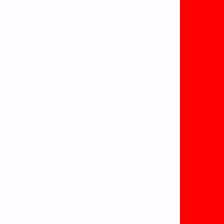

In [ ]:

mask = torch.zeros(224, 224).to(attribution.device)
mask[:, 180:] = 1

imgify(mask, symmetric=True)

### Visualization

In [ ]:
layer_map = {layer : cc for layer in layer_names}
fv_path = 'ViZ'

In [ ]:
fv = FeatureVisualization(attribution, ds_test, layer_map, path=fv_path)

In [ ]:
saved_files = fv.run(composite, 0, len(ds_test), 32, 100)

Running Analysis...


100%|██████████| 24/24 [00:04<00:00,  5.07it/s]


100%|██████████| 48/48 [00:00<00:00, 3626.98it/s]


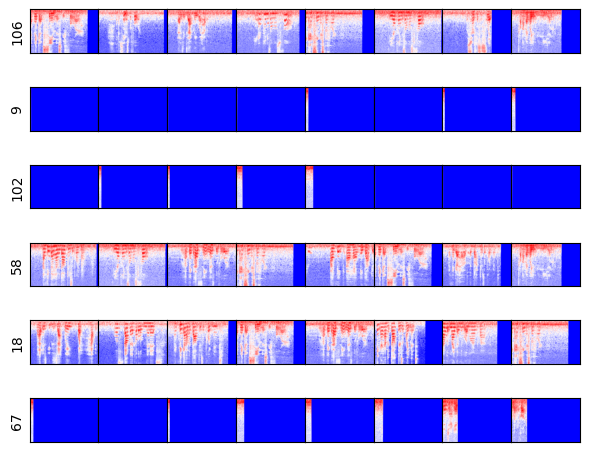

In [ ]:
%matplotlib inline
from crp.crp.image import plot_grid

ref_c = fv.get_max_reference([106,9, 102,  58,  18,  67], "layer2.conv2", "relevance", (0, 8))

plot_grid(ref_c, figsize=(6, 5), padding=False)

hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask
hello from mask_fct, 
  tensor([[[[-4.2771e-01, -8.6058e-01, -8.6624e-01,  ...,  2.9667e-01,
           -1.0504e-01, -4.1793e-01],
          [-5.2447e-01, -1.1924e+00, -1.2178e+00,  ..., -6.5022e-01,
           -9.8881e-01, -1.2619e+00],
          [-5.7013e-01, -1.2644e+00, -1.4603e+00,  ..., -1.6350e+00,
           -1.7334e+00, -1.6279e+00],
          ...,
          [-1.2311e-01,  1.4345e-02,  6.5603e-02,  ..., -8.7836e-01,
           -9.5239e-01, -1.2447e+00],
          [-1.0918e-01,  7.7647e-02,  7.5396e-02,  ..., -6.9732e-01,
           -6.9870e-01, -1.0190e+00],
          [-1.0689e-01, -6.6316e-02, -1.0756e-01,  ..., -4.6943e-01,
           -4.9686e-01, -6.8521e-01]],

         [[-7.8327e-01, -1.2843e+00, -1.5538e+00,  ..., -1.7330e+00,
           -1.7605e+00, -1.1501e+00],
          [-1.1893e+00, -1.7639e+00, -2.2022e+00,  ..., -2.9972e+00,
           -3

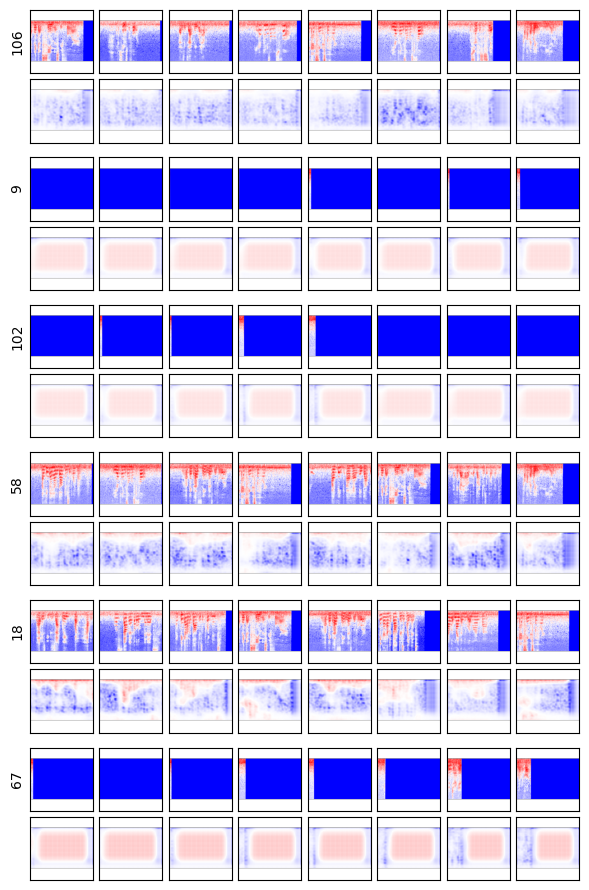

In [ ]:
ref_c = fv.get_max_reference([106,9, 102,  58,  18,  67], "layer2.conv2", "relevance", (0, 8), composite=composite, plot_fn=None)

plot_grid(ref_c, figsize=(6, 9))

hello from mask
hello from mask
hello from mask_fct, 
  tensor([[[[-4.2765e-01, -8.6042e-01, -8.6581e-01,  ...,  2.9662e-01,
           -1.0493e-01, -4.1758e-01],
          [-5.2441e-01, -1.1923e+00, -1.2174e+00,  ..., -6.5043e-01,
           -9.8863e-01, -1.2614e+00],
          [-5.7004e-01, -1.2644e+00, -1.4603e+00,  ..., -1.6353e+00,
           -1.7329e+00, -1.6272e+00],
          ...,
          [-1.2298e-01,  1.4565e-02,  6.5726e-02,  ..., -8.7853e-01,
           -9.5189e-01, -1.2444e+00],
          [-1.0908e-01,  7.7875e-02,  7.5697e-02,  ..., -6.9704e-01,
           -6.9842e-01, -1.0191e+00],
          [-1.0687e-01, -6.6289e-02, -1.0750e-01,  ..., -4.6928e-01,
           -4.9679e-01, -6.8551e-01]],

         [[-7.8317e-01, -1.2838e+00, -1.5534e+00,  ..., -1.7329e+00,
           -1.7602e+00, -1.1498e+00],
          [-1.1893e+00, -1.7635e+00, -2.2016e+00,  ..., -2.9970e+00,
           -3.1138e+00, -1.6816e+00],
          [-8.2068e-01, -1.1185e+00, -1.6425e+00,  ..., -2.1956e+00,
  

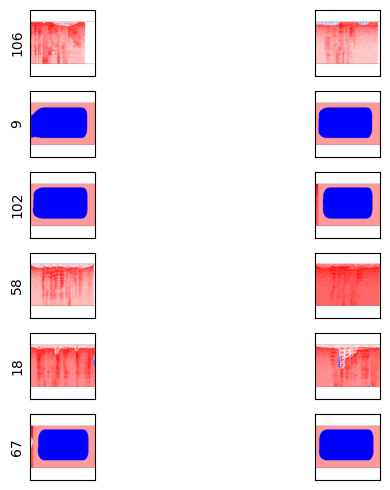

In [ ]:

from crp.crp.image import vis_opaque_img

ref_c = fv.get_max_reference([106,9, 102,  58,  18,  67], "layer2.conv2", "relevance", (0, 2), composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c, cmap="bwr", symmetric=True, figsize=(6, 5))

Zooming into the Receptive Field


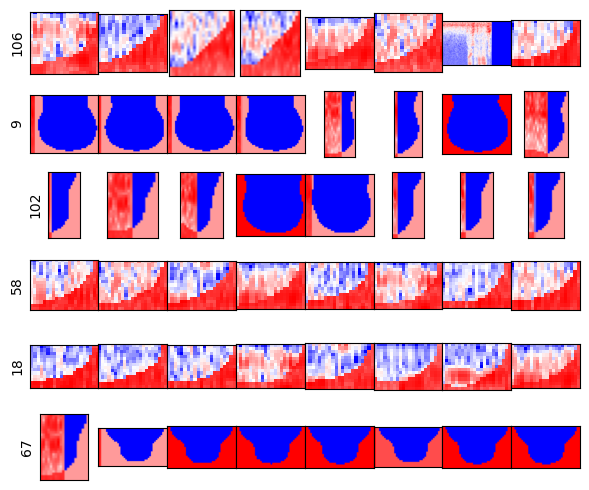

In [ ]:
ref_c = fv.get_max_reference([106,9, 102,  58,  18,  67], "layer2.conv2", "relevance", (0, 8), rf=True, composite=composite, plot_fn=vis_opaque_img)

plot_grid(ref_c, figsize=(6, 5), padding=False)